In [ ]:
# Data exploration and manipulation
import pandas as pd
import numpy as np
import missingno as msno
from scipy import stats
from statsmodels.formula.api import ols

# Graphics
from matplotlib import pyplot as plt
import plotly.express as px
import seaborn as sns

# Options
pd.set_option("display.max_columns",200)
%matplotlib inline

# Other librarys
import joblib
import pickle
import sys
from sklearn.pipeline import make_pipeline

# Model related libraries
from sklearn.metrics import mean_absolute_error, mean_squared_error

ModuleNotFoundError: No module named 'missingno'

In [ ]:
# User libraries
sys.path.insert(1, '../../usr_lib/')
import utilities
import modeling

In [ ]:
"""
TODO List
1. Charge data.
2. Preparing data.
    2.1. Exploring data.
    2.2. Clean and explore data.
3. Regression with train data.
    3.1. Feature selection.
    3.2. Model adjustment.
4. Test with test data
    4.3. Export results as CSV.
"""

'\nTODO List\n1. Charge data.\n2. Preparing data.\n    2.1. Exploring data.\n    2.2. Clean and explore data.\n3. Regression with train data.\n    3.1. Feature selection.\n    3.2. Model adjustment.\n4. Test with test data\n    4.3. Export results as CSV.\n'

In [ ]:
data_path = '../../data/modulo2/examen/DataExam1/'

# Airbnb

In [ ]:
train = pd.read_csv(data_path + 'airbnb_train.csv', sep=',', encoding='utf8')
test = pd.read_csv(data_path + 'airbnb_test.csv', sep=',', encoding='utf8')

In [6]:
train.head()

,id,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,description,first_review,host_has_profile_pic,host_identity_verified,host_response_rate,host_since,instant_bookable,last_review,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,thumbnail_url,zipcode,bedrooms,beds,price
0,46459,House,Private room,"{""Wireless Internet"",""Air conditioning"",Kitche...",2,0.0,Real Bed,strict,True,NYC,"This is a comfortable, simple beautiful room, ...",2015-09-24,t,t,100%,2011-09-19,f,2017-09-24,40.650360,-74.003574,AFFORDABLE & COZY IN SUNSET PARK T,Sunset Park,15,89.0,https://a0.muscache.com/im/pictures/105652616/...,11232,1.0,1.0,50.0
1,16468,Apartment,Entire home/apt,"{Internet,""Wireless Internet"",Kitchen,Heating,...",2,1.0,Real Bed,strict,True,LA,Renovated clean & modern 1 bedroom in the hear...,2015-06-15,t,t,NaN,2014-04-04,f,2016-07-24,33.987589,-118.474525,Luxurious and quiet - 30 second walk to the be...,Venice,12,98.0,NaN,90291,1.0,1.0,199.0
2,30190,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",4,1.0,Real Bed,strict,True,NYC,My studio is located in the heart of Bensonhur...,2016-01-03,t,f,80%,2015-09-02,f,2017-08-01,40.602618,-73.993318,Bensonhurst STYLISH STUDIO,Bensonhurst,26,94.0,https://a0.muscache.com/im/pictures/bf8ee448-b...,11214,0.0,2.0,85.0
3,43181,Townhouse,Private room,"{""Wireless Internet"",""Air conditioning"",""Pets ...",3,1.0,Real Bed,strict,True,LA,"我们位于洛杉矶圣盖博市,距离夏威夷超市,99大华超市,顺发超市(全部为华人超市,语言沟通无障...",2016-06-16,t,t,100%,2016-03-17,f,2017-03-29,34.072653,-118.096453,LA San Gabriel Suit room 圣盖博大套房 免费停车 Free Par...,San Gabriel,33,95.0,https://a0.muscache.com/im/pictures/0cff238c-a...,91776,1.0,2.0,70.0
4,62109,Condominium,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",5,2.0,Real Bed,strict,True,Chicago,Located in the heart of the bustling Woodlawn/...,2015-07-31,t,t,100%,2015-02-10,t,2017-03-19,41.781916,-87.606271,"XTRA Large 2bdrm 2bath in the City near ""El"" T...",Woodlawn,60,88.0,https://a0.muscache.com/im/pictures/92108903/0...,60637,2.0,2.0,72.0


In [7]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14823 entries, 0 to 14822
Data columns (total 28 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      14823 non-null  int64  
 1   property_type           14823 non-null  object 
 2   room_type               14823 non-null  object 
 3   amenities               14823 non-null  object 
 4   accommodates            14823 non-null  int64  
 5   bathrooms               14778 non-null  float64
 6   bed_type                14823 non-null  object 
 7   cancellation_policy     14823 non-null  object 
 8   cleaning_fee            14823 non-null  bool   
 9   city                    14823 non-null  object 
 10  description             14823 non-null  object 
 11  first_review            11621 non-null  object 
 12  host_has_profile_pic    14786 non-null  object 
 13  host_identity_verified  14786 non-null  object 
 14  host_response_rate      11082 non-null

In [8]:
varc = ['accommodates', 'bathrooms', 'number_of_reviews', 'bedrooms', 'beds', 'host_response_rate',
        'review_scores_rating']
varv = ['property_type', 'room_type', 'bed_type', 'cancellation_policy', 'cleaning_fee', 'host_has_profile_pic',
       'host_identity_verified', 'instant_bookable']
vart = ['amenities', 'description', 'name', 'thumbnail_url']
varg = ['city', 'neighbourhood', 'zipcode', 'latitude', 'longitude']
vard = ['first_review', 'host_since', 'last_review']
train = utilities.rename_variables(train, varc, 'c_')
train = utilities.rename_variables(train, varv, 'v_')
train = utilities.rename_variables(train, vart, 't_')
train = utilities.rename_variables(train, varg, 'g_')
train = utilities.rename_variables(train, vard, 'd_')

train.rename(columns={'price':'tgt_price'}, inplace=True)

In [9]:
train.head()

,id,v_property_type,v_room_type,t_amenities,c_accommodates,c_bathrooms,v_bed_type,v_cancellation_policy,v_cleaning_fee,g_city,t_description,d_first_review,v_host_has_profile_pic,v_host_identity_verified,c_host_response_rate,d_host_since,v_instant_bookable,d_last_review,g_latitude,g_longitude,t_name,g_neighbourhood,c_number_of_reviews,c_review_scores_rating,t_thumbnail_url,g_zipcode,c_bedrooms,c_beds,tgt_price
0,46459,House,Private room,"{""Wireless Internet"",""Air conditioning"",Kitche...",2,0.0,Real Bed,strict,True,NYC,"This is a comfortable, simple beautiful room, ...",2015-09-24,t,t,100%,2011-09-19,f,2017-09-24,40.650360,-74.003574,AFFORDABLE & COZY IN SUNSET PARK T,Sunset Park,15,89.0,https://a0.muscache.com/im/pictures/105652616/...,11232,1.0,1.0,50.0
1,16468,Apartment,Entire home/apt,"{Internet,""Wireless Internet"",Kitchen,Heating,...",2,1.0,Real Bed,strict,True,LA,Renovated clean & modern 1 bedroom in the hear...,2015-06-15,t,t,NaN,2014-04-04,f,2016-07-24,33.987589,-118.474525,Luxurious and quiet - 30 second walk to the be...,Venice,12,98.0,NaN,90291,1.0,1.0,199.0
2,30190,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",4,1.0,Real Bed,strict,True,NYC,My studio is located in the heart of Bensonhur...,2016-01-03,t,f,80%,2015-09-02,f,2017-08-01,40.602618,-73.993318,Bensonhurst STYLISH STUDIO,Bensonhurst,26,94.0,https://a0.muscache.com/im/pictures/bf8ee448-b...,11214,0.0,2.0,85.0
3,43181,Townhouse,Private room,"{""Wireless Internet"",""Air conditioning"",""Pets ...",3,1.0,Real Bed,strict,True,LA,"我们位于洛杉矶圣盖博市,距离夏威夷超市,99大华超市,顺发超市(全部为华人超市,语言沟通无障...",2016-06-16,t,t,100%,2016-03-17,f,2017-03-29,34.072653,-118.096453,LA San Gabriel Suit room 圣盖博大套房 免费停车 Free Par...,San Gabriel,33,95.0,https://a0.muscache.com/im/pictures/0cff238c-a...,91776,1.0,2.0,70.0
4,62109,Condominium,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",5,2.0,Real Bed,strict,True,Chicago,Located in the heart of the bustling Woodlawn/...,2015-07-31,t,t,100%,2015-02-10,t,2017-03-19,41.781916,-87.606271,"XTRA Large 2bdrm 2bath in the City near ""El"" T...",Woodlawn,60,88.0,https://a0.muscache.com/im/pictures/92108903/0...,60637,2.0,2.0,72.0


In [10]:
test = utilities.rename_variables(test, varc, 'c_')
test = utilities.rename_variables(test, varv, 'v_')
test = utilities.rename_variables(test, vart, 't_')
test = utilities.rename_variables(test, varg, 'g_')
test = utilities.rename_variables(test, vard, 'd_')

In [11]:
#Calcular campos
train.filter(like='d_')

,v_bed_type,d_first_review,d_host_since,d_last_review
0,Real Bed,2015-09-24,2011-09-19,2017-09-24
1,Real Bed,2015-06-15,2014-04-04,2016-07-24
2,Real Bed,2016-01-03,2015-09-02,2017-08-01
3,Real Bed,2016-06-16,2016-03-17,2017-03-29
4,Real Bed,2015-07-31,2015-02-10,2017-03-19
...,...,...,...,...
59283,Real Bed,2016-04-11,2011-08-23,2017-01-31
59284,Real Bed,2017-08-04,2010-07-02,2017-09-10
59285,Real Bed,NaN,2015-01-05,NaN
59286,Real Bed,2016-11-27,2014-08-13,2017-08-12


In [12]:
d_feat = list(train.filter(like='d_'))
d_feat[1:]

['d_first_review', 'd_host_since', 'd_last_review']

In [13]:
train[d_feat[1:]]

,d_first_review,d_host_since,d_last_review
0,2015-09-24,2011-09-19,2017-09-24
1,2015-06-15,2014-04-04,2016-07-24
2,2016-01-03,2015-09-02,2017-08-01
3,2016-06-16,2016-03-17,2017-03-29
4,2015-07-31,2015-02-10,2017-03-19
...,...,...,...
59283,2016-04-11,2011-08-23,2017-01-31
59284,2017-08-04,2010-07-02,2017-09-10
59285,NaN,2015-01-05,NaN
59286,2016-11-27,2014-08-13,2017-08-12


In [14]:
for i in d_feat[1:]:
    train[i] = pd.to_datetime(train[i])
    test[i] = pd.to_datetime(test[i])

In [15]:
train['d_year_fr'] = pd.DatetimeIndex(train['d_first_review']).year
train['d_year_hs'] = pd.DatetimeIndex(train['d_host_since']).year
train['d_year_lr'] = pd.DatetimeIndex(train['d_last_review']).year

In [16]:
test['d_year_fr'] = pd.DatetimeIndex(test['d_first_review']).year
test['d_year_hs'] = pd.DatetimeIndex(test['d_host_since']).year
test['d_year_lr'] = pd.DatetimeIndex(test['d_last_review']).year

In [17]:
train['c_first_review_age'] = 2022 - train['d_year_fr']
train['c_host_since_age'] = 2022 - train['d_year_hs']
train['c_last_review_age'] = 2022 - train['d_year_lr']

In [18]:
test['c_first_review_age'] = 2022 - test['d_year_fr']
test['c_host_since_age'] = 2022 - test['d_year_hs']
test['c_last_review_age'] = 2022 - test['d_year_lr']

In [19]:
test.drop(['d_year_fr', 'd_year_hs', 'd_year_lr', 'd_first_review', 'd_host_since', 'd_last_review'], axis=1, inplace=True)

In [20]:
train.drop(['d_year_fr', 'd_year_hs', 'd_year_lr', 'd_first_review', 'd_host_since', 'd_last_review'], axis=1, inplace=True)

In [21]:
train.head()

,id,v_property_type,v_room_type,t_amenities,c_accommodates,c_bathrooms,v_bed_type,v_cancellation_policy,v_cleaning_fee,g_city,t_description,v_host_has_profile_pic,v_host_identity_verified,c_host_response_rate,v_instant_bookable,g_latitude,g_longitude,t_name,g_neighbourhood,c_number_of_reviews,c_review_scores_rating,t_thumbnail_url,g_zipcode,c_bedrooms,c_beds,tgt_price,c_first_review_age,c_host_since_age,c_last_review_age
0,46459,House,Private room,"{""Wireless Internet"",""Air conditioning"",Kitche...",2,0.0,Real Bed,strict,True,NYC,"This is a comfortable, simple beautiful room, ...",t,t,100%,f,40.650360,-74.003574,AFFORDABLE & COZY IN SUNSET PARK T,Sunset Park,15,89.0,https://a0.muscache.com/im/pictures/105652616/...,11232,1.0,1.0,50.0,7.0,11.0,5.0
1,16468,Apartment,Entire home/apt,"{Internet,""Wireless Internet"",Kitchen,Heating,...",2,1.0,Real Bed,strict,True,LA,Renovated clean & modern 1 bedroom in the hear...,t,t,NaN,f,33.987589,-118.474525,Luxurious and quiet - 30 second walk to the be...,Venice,12,98.0,NaN,90291,1.0,1.0,199.0,7.0,8.0,6.0
2,30190,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",4,1.0,Real Bed,strict,True,NYC,My studio is located in the heart of Bensonhur...,t,f,80%,f,40.602618,-73.993318,Bensonhurst STYLISH STUDIO,Bensonhurst,26,94.0,https://a0.muscache.com/im/pictures/bf8ee448-b...,11214,0.0,2.0,85.0,6.0,7.0,5.0
3,43181,Townhouse,Private room,"{""Wireless Internet"",""Air conditioning"",""Pets ...",3,1.0,Real Bed,strict,True,LA,"我们位于洛杉矶圣盖博市,距离夏威夷超市,99大华超市,顺发超市(全部为华人超市,语言沟通无障...",t,t,100%,f,34.072653,-118.096453,LA San Gabriel Suit room 圣盖博大套房 免费停车 Free Par...,San Gabriel,33,95.0,https://a0.muscache.com/im/pictures/0cff238c-a...,91776,1.0,2.0,70.0,6.0,6.0,5.0
4,62109,Condominium,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",5,2.0,Real Bed,strict,True,Chicago,Located in the heart of the bustling Woodlawn/...,t,t,100%,t,41.781916,-87.606271,"XTRA Large 2bdrm 2bath in the City near ""El"" T...",Woodlawn,60,88.0,https://a0.muscache.com/im/pictures/92108903/0...,60637,2.0,2.0,72.0,7.0,7.0,5.0


In [22]:
train.drop(columns=['t_thumbnail_url', 'g_neighbourhood'], axis=1, inplace=True)
test.drop(columns=['t_thumbnail_url', 'g_neighbourhood'], axis=1, inplace=True)

In [23]:
v_feats = list(train.filter(like='v_'))
v_feats

['v_property_type',
 'v_room_type',
 'v_bed_type',
 'v_cancellation_policy',
 'v_cleaning_fee',
 'v_host_has_profile_pic',
 'v_host_identity_verified',
 'v_instant_bookable']

In [24]:
for i in v_feats:
    print(i, train[i].unique())

v_property_type ['House' 'Apartment' 'Townhouse' 'Condominium' 'Villa' 'Loft'
 'Bed & Breakfast' 'Guesthouse' 'Other' 'Boutique hotel' 'Bungalow'
 'Cabin' 'Boat' 'Hostel' 'Camper/RV' 'Guest suite' 'Dorm' 'Vacation home'
 'In-law' 'Tent' 'Treehouse' 'Timeshare' 'Castle' 'Yurt' 'Tipi'
 'Earth House' 'Serviced apartment' 'Hut' 'Island' 'Chalet' 'Train' 'Cave'
 'Lighthouse']
v_room_type ['Private room' 'Entire home/apt' 'Shared room']
v_bed_type ['Real Bed' 'Futon' 'Airbed' 'Pull-out Sofa' 'Couch']
v_cancellation_policy ['strict' 'flexible' 'moderate' 'super_strict_30' 'super_strict_60']
v_cleaning_fee [ True False]
v_host_has_profile_pic ['t' nan 'f']
v_host_identity_verified ['t' 'f' nan]
v_instant_bookable ['f' 't']


In [25]:
train['v_host_has_profile_pic'].value_counts(dropna=False)

t      58953
f        184
NaN      151
Name: v_host_has_profile_pic, dtype: int64

In [26]:
train['v_host_identity_verified'].value_counts(dropna=False)

t      39832
f      19305
NaN      151
Name: v_host_identity_verified, dtype: int64

<AxesSubplot:>

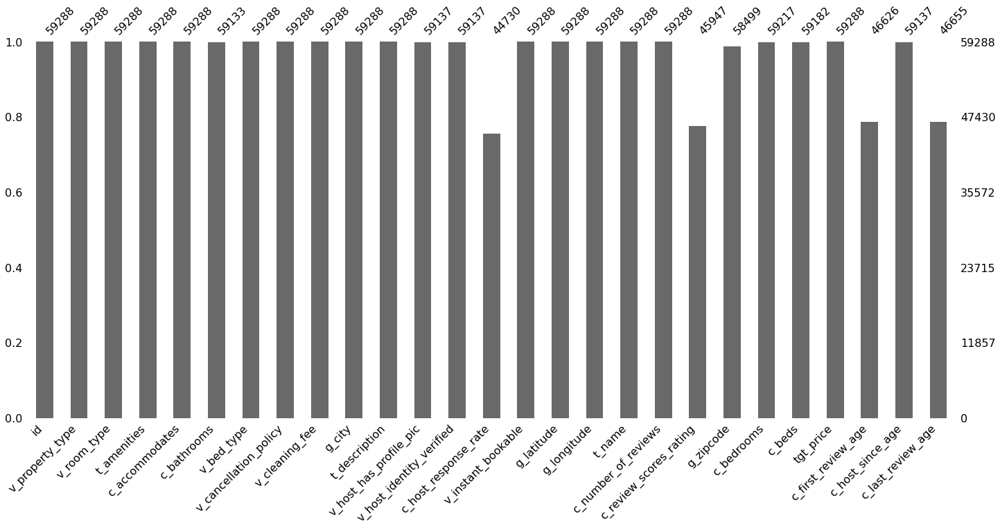

In [27]:
msno.bar(train)

In [28]:
c_feats = list(train.filter(like='c_'))
c_feats

['c_accommodates',
 'c_bathrooms',
 'c_host_response_rate',
 'c_number_of_reviews',
 'c_review_scores_rating',
 'c_bedrooms',
 'c_beds',
 'c_first_review_age',
 'c_host_since_age',
 'c_last_review_age']

In [29]:
train[c_feats] = train[c_feats].fillna(0)

In [30]:
test[c_feats] = train[c_feats].fillna(0)

In [31]:
train.dropna(inplace=True)

In [32]:
test.dropna(inplace=True)

In [33]:
train.head()

,id,v_property_type,v_room_type,t_amenities,c_accommodates,c_bathrooms,v_bed_type,v_cancellation_policy,v_cleaning_fee,g_city,t_description,v_host_has_profile_pic,v_host_identity_verified,c_host_response_rate,v_instant_bookable,g_latitude,g_longitude,t_name,c_number_of_reviews,c_review_scores_rating,g_zipcode,c_bedrooms,c_beds,tgt_price,c_first_review_age,c_host_since_age,c_last_review_age
0,46459,House,Private room,"{""Wireless Internet"",""Air conditioning"",Kitche...",2,0.0,Real Bed,strict,True,NYC,"This is a comfortable, simple beautiful room, ...",t,t,100%,f,40.650360,-74.003574,AFFORDABLE & COZY IN SUNSET PARK T,15,89.0,11232,1.0,1.0,50.0,7.0,11.0,5.0
1,16468,Apartment,Entire home/apt,"{Internet,""Wireless Internet"",Kitchen,Heating,...",2,1.0,Real Bed,strict,True,LA,Renovated clean & modern 1 bedroom in the hear...,t,t,0,f,33.987589,-118.474525,Luxurious and quiet - 30 second walk to the be...,12,98.0,90291,1.0,1.0,199.0,7.0,8.0,6.0
2,30190,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",4,1.0,Real Bed,strict,True,NYC,My studio is located in the heart of Bensonhur...,t,f,80%,f,40.602618,-73.993318,Bensonhurst STYLISH STUDIO,26,94.0,11214,0.0,2.0,85.0,6.0,7.0,5.0
3,43181,Townhouse,Private room,"{""Wireless Internet"",""Air conditioning"",""Pets ...",3,1.0,Real Bed,strict,True,LA,"我们位于洛杉矶圣盖博市,距离夏威夷超市,99大华超市,顺发超市(全部为华人超市,语言沟通无障...",t,t,100%,f,34.072653,-118.096453,LA San Gabriel Suit room 圣盖博大套房 免费停车 Free Par...,33,95.0,91776,1.0,2.0,70.0,6.0,6.0,5.0
4,62109,Condominium,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",5,2.0,Real Bed,strict,True,Chicago,Located in the heart of the bustling Woodlawn/...,t,t,100%,t,41.781916,-87.606271,"XTRA Large 2bdrm 2bath in the City near ""El"" T...",60,88.0,60637,2.0,2.0,72.0,7.0,7.0,5.0


In [34]:
train.tail()

,id,v_property_type,v_room_type,t_amenities,c_accommodates,c_bathrooms,v_bed_type,v_cancellation_policy,v_cleaning_fee,g_city,t_description,v_host_has_profile_pic,v_host_identity_verified,c_host_response_rate,v_instant_bookable,g_latitude,g_longitude,t_name,c_number_of_reviews,c_review_scores_rating,g_zipcode,c_bedrooms,c_beds,tgt_price,c_first_review_age,c_host_since_age,c_last_review_age
59283,64666,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",5,2.0,Real Bed,moderate,True,LA,Our newly renovated House is in the Lake Balbo...,t,t,100%,f,34.198832,-118.501966,Lake Balboa House / Zen Retreat!,5,88.0,91406,3.0,3.0,225.0,6.0,11.0,5.0
59284,10864,Condominium,Entire home/apt,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",2,1.5,Real Bed,strict,True,NYC,Beautiful modern duplex in old traditional Har...,t,t,100%,f,40.807678,-73.952439,Modern Beautiful Duplex in Brownstone,11,100.0,10027,1.0,1.0,200.0,5.0,12.0,5.0
59285,14978,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",3,1.0,Real Bed,moderate,True,LA,Explore Los Angeles with your own private cott...,t,t,33%,f,34.030466,-118.444475,Artsy and Spacious Back House,0,0.0,90064,1.0,2.0,135.0,0.0,7.0,0.0
59286,58971,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",""Wh...",3,1.0,Real Bed,strict,True,NYC,Quiet 1 bedroom apartment located in luxury co...,t,t,86%,f,40.700510,-73.939087,Cozy Apartment off J&M Subway Lines,11,100.0,11206,1.0,1.0,115.0,6.0,8.0,5.0
59287,35007,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",14,3.0,Real Bed,strict,True,LA,Come stay in this nice and spacious 4 bedroom ...,t,t,84%,f,34.046513,-118.377014,KOSHER-FRIENDLY 4 BEDROOM SLEEPS 10 and up to 12,6,93.0,90035,4.0,5.0,360.0,7.0,8.0,6.0


In [35]:
train[v_feats]

,v_property_type,v_room_type,v_bed_type,v_cancellation_policy,v_cleaning_fee,v_host_has_profile_pic,v_host_identity_verified,v_instant_bookable
0,House,Private room,Real Bed,strict,True,t,t,f
1,Apartment,Entire home/apt,Real Bed,strict,True,t,t,f
2,Apartment,Entire home/apt,Real Bed,strict,True,t,f,f
3,Townhouse,Private room,Real Bed,strict,True,t,t,f
4,Condominium,Entire home/apt,Real Bed,strict,True,t,t,t
...,...,...,...,...,...,...,...,...
59283,House,Entire home/apt,Real Bed,moderate,True,t,t,f
59284,Condominium,Entire home/apt,Real Bed,strict,True,t,t,f
59285,Apartment,Entire home/apt,Real Bed,moderate,True,t,t,f
59286,Apartment,Entire home/apt,Real Bed,strict,True,t,t,f


In [36]:
train.drop(columns=v_feats, axis=1, inplace=True)

In [37]:
test.drop(columns=v_feats, axis=1, inplace=True)

In [38]:
train.head()

,id,t_amenities,c_accommodates,c_bathrooms,g_city,t_description,c_host_response_rate,g_latitude,g_longitude,t_name,c_number_of_reviews,c_review_scores_rating,g_zipcode,c_bedrooms,c_beds,tgt_price,c_first_review_age,c_host_since_age,c_last_review_age
0,46459,"{""Wireless Internet"",""Air conditioning"",Kitche...",2,0.0,NYC,"This is a comfortable, simple beautiful room, ...",100%,40.650360,-74.003574,AFFORDABLE & COZY IN SUNSET PARK T,15,89.0,11232,1.0,1.0,50.0,7.0,11.0,5.0
1,16468,"{Internet,""Wireless Internet"",Kitchen,Heating,...",2,1.0,LA,Renovated clean & modern 1 bedroom in the hear...,0,33.987589,-118.474525,Luxurious and quiet - 30 second walk to the be...,12,98.0,90291,1.0,1.0,199.0,7.0,8.0,6.0
2,30190,"{TV,Internet,""Wireless Internet"",""Air conditio...",4,1.0,NYC,My studio is located in the heart of Bensonhur...,80%,40.602618,-73.993318,Bensonhurst STYLISH STUDIO,26,94.0,11214,0.0,2.0,85.0,6.0,7.0,5.0
3,43181,"{""Wireless Internet"",""Air conditioning"",""Pets ...",3,1.0,LA,"我们位于洛杉矶圣盖博市,距离夏威夷超市,99大华超市,顺发超市(全部为华人超市,语言沟通无障...",100%,34.072653,-118.096453,LA San Gabriel Suit room 圣盖博大套房 免费停车 Free Par...,33,95.0,91776,1.0,2.0,70.0,6.0,6.0,5.0
4,62109,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",5,2.0,Chicago,Located in the heart of the bustling Woodlawn/...,100%,41.781916,-87.606271,"XTRA Large 2bdrm 2bath in the City near ""El"" T...",60,88.0,60637,2.0,2.0,72.0,7.0,7.0,5.0


In [39]:
def limpia_porcentaje(x):
    if x == '0' or x == 0:
        return int(x)
    else:
        return int(x[:-1])

In [40]:
train.drop(columns=['g_zipcode'], axis=1, inplace=True)
test.drop(columns=['g_zipcode'], axis=1, inplace=True)

In [41]:
train['g_latitude'] = train['g_latitude'].astype(float)

In [42]:
test['g_latitude'] = test['g_latitude'].astype(float)

In [43]:
train['g_longitude'] = train['g_longitude'].astype(float)

In [44]:
test['g_longitude'] = test['g_longitude'].astype(float)

In [45]:
train['c_host_response_rate'] = train['c_host_response_rate'].map(limpia_porcentaje)

In [46]:
test['c_host_response_rate'] = test['c_host_response_rate'].map(limpia_porcentaje)

In [47]:
train.drop(columns = ['t_name', 'g_city', 't_description'], axis = 1, inplace=True)

In [48]:
test.drop(columns = ['t_name', 'g_city', 't_description'], axis = 1, inplace=True)

In [49]:
train.head(5)

,id,t_amenities,c_accommodates,c_bathrooms,c_host_response_rate,g_latitude,g_longitude,c_number_of_reviews,c_review_scores_rating,c_bedrooms,c_beds,tgt_price,c_first_review_age,c_host_since_age,c_last_review_age
0,46459,"{""Wireless Internet"",""Air conditioning"",Kitche...",2,0.0,100,40.650360,-74.003574,15,89.0,1.0,1.0,50.0,7.0,11.0,5.0
1,16468,"{Internet,""Wireless Internet"",Kitchen,Heating,...",2,1.0,0,33.987589,-118.474525,12,98.0,1.0,1.0,199.0,7.0,8.0,6.0
2,30190,"{TV,Internet,""Wireless Internet"",""Air conditio...",4,1.0,80,40.602618,-73.993318,26,94.0,0.0,2.0,85.0,6.0,7.0,5.0
3,43181,"{""Wireless Internet"",""Air conditioning"",""Pets ...",3,1.0,100,34.072653,-118.096453,33,95.0,1.0,2.0,70.0,6.0,6.0,5.0
4,62109,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",5,2.0,100,41.781916,-87.606271,60,88.0,2.0,2.0,72.0,7.0,7.0,5.0


In [50]:
train['t_amenities'] = train['t_amenities'].map(utilities.clean_text)

In [51]:
test['t_amenities'] = test['t_amenities'].map(utilities.clean_text)

In [52]:
# Text variable manuipulation
import nltk
stop_words=nltk.corpus.stopwords.words("english")
train["t_amenities"]=train["t_amenities"].map(lambda text:" ".join([x for x in text.split(" ") if x not in stop_words]))

In [53]:
corpus=" ".join(train["t_amenities"].values)

In [54]:
fdist=nltk.FreqDist(corpus.split())

In [55]:
pd.DataFrame(fdist.items()).sort_values(by=[1])

,0,1
193,rails,2
183,roll,3
184,paid,6
190,lake,13
180,purifier,13
...,...,...
8,friendly,63573
40,dryer,67762
0,wireless,69482
10,detector,85872


In [56]:
list_hapaxes=fdist.hapaxes()

In [57]:
train["t_amenities"]=train["t_amenities"].map(lambda text:" ".join([x for x in text.split(" ") if x not in list_hapaxes]))

In [58]:
train["t_amenities_l"]=train["t_amenities"].map(lambda x:x.split())

In [59]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [60]:
train.head()

,id,t_amenities,c_accommodates,c_bathrooms,c_host_response_rate,g_latitude,g_longitude,c_number_of_reviews,c_review_scores_rating,c_bedrooms,c_beds,tgt_price,c_first_review_age,c_host_since_age,c_last_review_age,t_amenities_l
0,46459,wireless internet air conditioning kitchen hea...,2,0.0,100,40.650360,-74.003574,15,89.0,1.0,1.0,50.0,7.0,11.0,5.0,"[wireless, internet, air, conditioning, kitche..."
1,16468,internet wireless internet kitchen heating smo...,2,1.0,0,33.987589,-118.474525,12,98.0,1.0,1.0,199.0,7.0,8.0,6.0,"[internet, wireless, internet, kitchen, heatin..."
2,30190,tv internet wireless internet air conditioning...,4,1.0,80,40.602618,-73.993318,26,94.0,0.0,2.0,85.0,6.0,7.0,5.0,"[tv, internet, wireless, internet, air, condit..."
3,43181,wireless internet air conditioning pets live p...,3,1.0,100,34.072653,-118.096453,33,95.0,1.0,2.0,70.0,6.0,6.0,5.0,"[wireless, internet, air, conditioning, pets, ..."
4,62109,tv cable tv internet wireless internet air con...,5,2.0,100,41.781916,-87.606271,60,88.0,2.0,2.0,72.0,7.0,7.0,5.0,"[tv, cable, tv, internet, wireless, internet, ..."


In [61]:
vect = TfidfVectorizer()
vect.fit(train["t_amenities"])
array_train= vect.transform(train["t_amenities"])

In [62]:
aux_train=pd.DataFrame(array_train.toarray(),columns=vect.get_feature_names())

In [63]:
train=pd.concat([train.reset_index(drop=True),aux_train.reset_index(drop=True)],axis=1)

In [64]:
train.head()

,id,t_amenities,c_accommodates,c_bathrooms,c_host_response_rate,g_latitude,g_longitude,c_number_of_reviews,c_review_scores_rating,c_bedrooms,c_beds,tgt_price,c_first_review_age,c_host_since_age,c_last_review_age,t_amenities_l,24,49,50,access,accessible,aid,air,allowed,amenity,baby,babysitter,backyard,balcony,bars,basics,bath,bathroom,bathtub,bbq,beach,beachfront,bed,bedroom,blankets,books,breakfast,building,buzzer,cable,carbon,card,cat,chair,changing,charger,check,checkout,childrens,cleaning,clearance,coffee,conditioning,connection,console,cooking,corner,covers,crib,darkening,detector,dinnerware,disabled,dishes,dishwasher,dog,door,doorman,doorway,dropoff,dryer,elevator,en,entrance,entry,entryway,essentials,ethernet,ev,events,extinguisher,extra,family,fire,fireplace,firm,first,fixed,flat,floor,free,friendly,front,game,garden,...,handheld,hangers,head,heating,height,high,home,host,hosting,hot,hour,indoor,intercom,internet,iron,kettle,keypad,kid,kit,kitchen,lake,laptop,level,linens,lit,live,living,lock,lockbox,long,luggage,maker,matress,mattress,microwave,missing,monitor,monoxide,night,outlet,oven,pack,paid,parking,path,pathway,patio,pet,pets,pillows,play,pocket,pool,premises,private,property,purifier,rails,recommendations,refrigerator,roll,room,safety,self,shades,shampoo,shower,silverware,single,ski,smart,smartlock,smoke,smoking,smooth,spot,stair,stays,step,stove,street,suitable,table,term,toilet,toys,translation,travel,tub,tv,washer,water,waterfront,well,wheelchair,wide,wifi,window,wireless,workspace
0,46459,wireless internet air conditioning kitchen hea...,2,0.0,100,40.650360,-74.003574,15,89.0,1.0,1.0,50.0,7.0,11.0,5.0,"[wireless, internet, air, conditioning, kitche...",0.000000,0.000000,0.000000,0.0,0.000000,0.250503,0.163104,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.182821,0.360467,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.163109,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.296218,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.0,0.0,0.0,0.144562,0.0,0.0,0.0,0.236459,0.0,0.213509,0.236459,0.0,0.0,0.250503,0.0,0.0,0.0,0.000000,0.160442,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.138651,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.130335,0.000000,0.0,0.0,0.213509,0.250503,0.137816,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.182821,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.360467,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.148961,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.130543,0.000000
1,16468,internet wireless internet kitchen heating smo...,2,1.0,0,33.987589,-118.474525,12,98.0,1.0,1.0,199.0,7.0,8.0,6.0,"[internet, wireless, internet, kitchen, heatin...",0.000000,0.198686,0.180137,0.0,0.000000,0.000000,0.000000,0.000000,0.346966,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.210022,0.0,0.0,0.0,0.0,0.000000,0.000000,0.125843,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.203899,0.0,0.0,0.0,0.0,0.0,0.208885,0.0,0.0,0.0,0.000000,0.00000,0.346966,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.162764,0.0,0.000000,0.162764,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.095439,0.0,0.0,0.0,0.0,0.346966,0.000000,0.000000,0.0,0.000000,0.179429,0.000000,0.0,0.0,0.000000,0.000000,0.094864,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.208045,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.346966,0.0,0.125843,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.102536,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.346966,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.089858,0.000000
2,30190,tv internet wireless internet air conditioning...,4,1.0,80,4

In [65]:
test["t_amenities"]=test["t_amenities"].map(lambda text:" ".join([x for x in text.split(" ") if x not in stop_words]))
corpus=" ".join(test["t_amenities"].values)
fdist=nltk.FreqDist(corpus.split())
pd.DataFrame(fdist.items()).sort_values(by=[1])
list_hapaxes=fdist.hapaxes()
test["t_amenities"]=test["t_amenities"].map(lambda text:" ".join([x for x in text.split(" ") if x not in list_hapaxes]))
test["t_amenities_l"]=test["t_amenities"].map(lambda x:x.split())
vect = TfidfVectorizer()
vect.fit(test["t_amenities"])
array_test= vect.transform(test["t_amenities"])
aux_test=pd.DataFrame(array_test.toarray(),columns=vect.get_feature_names())
test=pd.concat([test.reset_index(drop=True),aux_test.reset_index(drop=True)],axis=1)

In [66]:
test.head()

,id,t_amenities,c_accommodates,c_bathrooms,c_host_response_rate,g_latitude,g_longitude,c_number_of_reviews,c_review_scores_rating,c_bedrooms,c_beds,c_first_review_age,c_host_since_age,c_last_review_age,t_amenities_l,24,49,50,access,accessible,aid,air,allowed,amenity,baby,babysitter,backyard,balcony,bars,basics,bath,bathroom,bathtub,bbq,beach,beachfront,bed,bedroom,blankets,books,breakfast,building,buzzer,cable,carbon,card,cat,chair,changing,charger,check,checkout,childrens,cleaning,clearance,coffee,conditioning,connection,console,cooking,corner,covers,crib,darkening,detector,dinnerware,disabled,dishes,dishwasher,dog,door,doorman,doorway,dropoff,dryer,elevator,en,entrance,entry,entryway,essentials,ethernet,ev,events,extinguisher,extra,family,fire,fireplace,firm,first,fixed,flat,floor,free,friendly,front,game,garden,gates,...,hallway,hand,handheld,hangers,head,heating,height,high,home,host,hosting,hot,hour,indoor,intercom,internet,iron,kettle,keypad,kid,kit,kitchen,lake,laptop,level,linens,lit,live,living,lock,lockbox,long,luggage,maker,mattress,microwave,missing,monitor,monoxide,night,outlet,oven,pack,paper,parking,path,pathway,patio,pet,pets,pillows,play,pocket,pool,premises,private,property,recommendations,refrigerator,room,safety,self,shades,shampoo,shower,silverware,single,ski,smart,smartlock,smoke,smoking,smooth,soap,spot,stair,stays,step,stove,street,suitable,table,term,toilet,towel,toys,translation,travel,tub,tv,washer,water,waterfront,well,wheelchair,wide,wifi,window,wireless,workspace
0,10537,tv cable tv wireless internet air conditioning...,2,0.0,100,40.739506,-73.981459,15,89.0,1.0,1.0,7.0,11.0,5.0,"[tv, cable, tv, wireless, internet, air, condi...",0.000000,0.200098,0.181426,0.0,0.0,0.000000,0.112653,0.000000,0.349799,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.183173,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.112661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.321899,0.0,0.0,0.106867,0.213025,0.349799,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.349799,0.0,0.000000,0.000000,0.000000,0.089958,0.000000,0.0,0.0,0.000000,0.000000,0.094908,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.349799,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.349799,0.0,0.0,0.230108,0.133104,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.090161,0.000000
1,64893,tv cable tv internet wireless internet air con...,2,1.0,0,33.869185,-118.383966,12,98.0,1.0,1.0,7.0,8.0,6.0,"[tv, cable, tv, internet, wireless, internet, ...",0.181596,0.000000,0.000000,0.0,0.0,0.154782,0.100545,0.204994,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.188247,0.0,0.0,0.0,0.0,0.000000,0.163484,0.112668,0.000000,0.000000,0.0,0.000000,0.0,0.162557,0.0,0.0,0.0,0.0,0.0,0.100552,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.183135,0.0,0.0,0.0,0.0,0.0,0.186975,0.000000,0.0,0.0,0.190760,0.000000,0.000000,0.0,0.0,0.0,0.089120,0.0,0.0,0.000000,0.146337,0.0,0.000000,0.146337,0.237857,0.0,0.154782,0.0,0.0,0.0,0.164178,0.098920,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.109607,0.0,0.085232,0.0,0.0,0.0,0.0,0.000000,0.0,0.181596,0.238193,0.000000,0.160577,0.122346,0.0,0.0,0.000000,0.154782,0.084707,0.0,0.118834,0.0,0.0,0.0,0.000000,0.0,0.186110,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.112668,0.0,0.0,0.0,0.0,0.0,0.166483,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.166667,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.109239,0.0,0.0,0.0,0.0,0.0,0.0,0.092033,0.311812,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.205374,0.118797,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.080470,0.118834
2,1838

In [67]:
train.drop(columns = ['id', 't_amenities', 't_amenities_l'], axis = 1, inplace=True)
test.drop(columns = ['t_amenities', 't_amenities_l'], axis = 1, inplace=True)

In [68]:
#Normalización por Standard Scaler
var_train = list(train.columns)

var_test = list(test.columns)


In [69]:
var_train.pop(var_train.index('tgt_price'))

'tgt_price'

In [70]:
from sklearn.preprocessing import StandardScaler
st  = StandardScaler()

In [71]:
st_train = pd.DataFrame(st.fit_transform(train[var_train]), columns=var_train)
st_test =pd.DataFrame(st.fit_transform(test[var_test]), columns=var_test)

In [86]:
train['tgt_price'].describe()

count    58350.000000
mean       159.733213
std        167.372458
min          5.000000
25%         75.000000
50%        110.000000
75%        185.000000
max       1999.000000
Name: tgt_price, dtype: float64

In [87]:
# Definición del espacio X,y
X = st_train.copy()
y = pd.Series(np.log(train['tgt_price']))

In [88]:
# Regresión
from sklearn.linear_model import LinearRegression, Lars, Ridge, Lasso, ElasticNet, SGDRegressor, BayesianRidge
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.kernel_ridge import KernelRidge

lr = LinearRegression()
lars = Lars()
rg = Ridge(alpha=.5)
lasso = Lasso(alpha=.5)
en = ElasticNet(alpha=.5)
sdg = SGDRegressor()
bay = BayesianRidge()
lda = LinearDiscriminantAnalysis()
krg = KernelRidge()

In [89]:
train = modeling.ajusta_modelo_lineal(train, X, y, tgt='tgt_price', modelo=lr, flag=False)

****************************************************************************************************
LinearRegression()
****************************************************************************************************
Estadísticos de interés
****************************************************************************************************
El modelo tiene un error aboluto medio de: 0.4039062230979953
El modelo tiene un error cuadrático medio de: 0.2806885678549231
****************************************************************************************************
Coeficientes:
Beta0 = 0.3204478778482608, c_accommodates
Beta1 = 0.04712871182834216, c_bathrooms
Beta2 = -0.06759330565157419, c_host_response_rate
Beta3 = 0.10296604307675933, g_latitude
Beta4 = -0.1128433175327932, g_longitude
Beta5 = -0.02779530251063722, c_number_of_reviews
Beta6 = 0.02477476919482617, c_review_scores_rating
Beta7 = 0.10239979041699818, c_bedrooms
Beta8 = -0.07665912402835892, c_beds
Beta9 = 0.0354798

In [84]:
train = modeling.ajusta_modelo_lineal(train, X, y, tgt='tgt_price', modelo=lasso, flag=False)

****************************************************************************************************
Lasso(alpha=0.5)
****************************************************************************************************
Estadísticos de interés
****************************************************************************************************
El modelo tiene un error aboluto medio de: 73.28179480709294
El modelo tiene un error cuadrático medio de: 17172.743873724015
****************************************************************************************************
Coeficientes:
Beta0 = 57.08792568664615, c_accommodates
Beta1 = 34.55021364982531, c_bathrooms
Beta2 = -12.448615221636048, c_host_response_rate
Beta3 = 10.560860510254766, g_latitude
Beta4 = -11.037019358219181, g_longitude
Beta5 = -3.789180835725915, c_number_of_reviews
Beta6 = -0.0, c_review_scores_rating
Beta7 = 26.810576526261627, c_bedrooms
Beta8 = -13.06707255883492, c_beds
Beta9 = 0.0, c_first_review_age
Beta10 = 4.30

In [76]:
train['n_tgt_price'] = np.log(train['tgt_price'])